In [1]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from collections import defaultdict

# Define the Pose Estimation Model
class PoseEstimationNet(nn.Module):
    def __init__(self, input_size, output_size):
        super(PoseEstimationNet, self).__init__()
        self.fc1 = nn.Linear(input_size, 1024)
        self.bn1 = nn.BatchNorm1d(1024)
        self.dropout1 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(1024, 512)
        self.bn2 = nn.BatchNorm1d(512)
        self.dropout2 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(512, output_size)

    def forward(self, x):
        x = F.relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

class ObjectDatasetByID(Dataset):
    def __init__(self, data_2d_path, data_3d_path):
        self.data_by_id = defaultdict(lambda: {"2d": [], "3d": []})
        self.expected_output_size = 31  # Expected output size based on structure

        files_2d = sorted([f for f in os.listdir(data_2d_path) if f.endswith('.csv')])
        
        for file_2d in files_2d:
            data_2d_file_path = os.path.join(data_2d_path, file_2d)
            data_3d_file_path = os.path.join(data_3d_path, file_2d)

            if not os.path.exists(data_3d_file_path):
                print(f"Skipping; 3D file missing for: {file_2d}")
                continue

            try:
                df_2d = pd.read_csv(data_2d_file_path, header=None)
                df_3d = pd.read_csv(data_3d_file_path, header=None)

                if len(df_2d) != len(df_3d):
                    print(f"Skipping; row count mismatch in files: {file_2d}")
                    continue
                if df_3d.shape[1] != self.expected_output_size:
                    print(f"Skipping; 3D data size mismatch for file {file_2d}")
                    continue

                for row_2d, row_3d in zip(df_2d.values, df_3d.values):
                    obj_id = int(row_2d[0])  # First column is the ID
                    self.data_by_id[obj_id]["2d"].append(torch.tensor(row_2d[1:], dtype=torch.float32)) 
                    self.data_by_id[obj_id]["3d"].append(torch.tensor(row_3d[1:], dtype=torch.float32))

            except (pd.errors.EmptyDataError, ValueError):
                print(f"Skipping invalid file pair: {file_2d}")

    def get_data_by_id(self):
        # Returns the data separated by ID
        return {obj_id: (torch.stack(data["2d"]), torch.stack(data["3d"]))
                for obj_id, data in self.data_by_id.items()}


In [9]:
import torch.optim as optim
import time

# Evaluation function
def evaluate_model(model, data_loader, criterion, device='cpu'):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for inputs, targets in data_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            running_loss += loss.item()
    return running_loss / len(data_loader)

# Training function with early stopping
def train_model_for_id(
    model, train_loader, val_loader, criterion, optimizer, 
    num_epochs=10, patience=5, device='cpu', obj_id=None
):
    model.to(device)
    best_val_loss = float('inf')
    epochs_without_improvement = 0

    print(f"\n{'='*50}")
    print(f"Training Start for ID {obj_id}")
    print(f"{'='*50}\n")

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in train_loader:
            # Handle single-sample batches
            if inputs.size(0) < 2:
                print("Switching to eval mode for single-sample batch.")
                model.eval()  # Use eval mode for BatchNorm1d
                with torch.no_grad():
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                model.train()  # Switch back to train mode
                continue

            # Normal training process for batches with sufficient samples
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            running_loss += loss.item()
            loss.backward()
            optimizer.step()

        train_loss = running_loss / len(train_loader)
        val_loss = evaluate_model(model, val_loader, criterion, device)

        print(f"ID: {obj_id} - Epoch [{epoch+1}/{num_epochs}] - "
              f"Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

        # Early stopping and model saving logic
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_without_improvement = 0
            torch.save(model.state_dict(), f"sye{obj_id}.pth")
            print(f"Validation loss improved. Model for ID {obj_id} saved.")
        else:
            epochs_without_improvement += 1
            print(f"No improvement for {epochs_without_improvement} epochs.")

        if epochs_without_improvement >= patience:
            print(f"Early stopping triggered for ID {obj_id} after {epoch+1} epochs.")
            break


In [10]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader, random_split

base_path = "C:\\Users\\sakar\\OneDrive\\mt-datas\\synthetic_data"
dataset_name = "8_correct_relative"
data_2d_subfolder = "2d_data"
data_3d_subfolder = "3d_data"

# Construct paths to the data directories
data_2d_path = os.path.join(base_path, dataset_name, data_2d_subfolder)
data_3d_path = os.path.join(base_path, dataset_name, data_3d_subfolder)

# Load the dataset and get data by ID
object_dataset_by_id = ObjectDatasetByID(data_2d_path, data_3d_path)
data_by_id = object_dataset_by_id.get_data_by_id()

# Model parameters
input_size = 20
output_size = 30
learning_rate = 0.001
num_epochs = 50
patience = 5  # Early stopping patience

# Loss function
criterion = nn.MSELoss()

# Loop through each unique ID to train and save models
for obj_id, (data_2d, data_3d) in data_by_id.items():
    dataset = torch.utils.data.TensorDataset(data_2d, data_3d)
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size

    if train_size == 0 or val_size == 0:
        print(f"Skipping ID {obj_id} due to insufficient data.")
        continue

    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

    model = PoseEstimationNet(input_size=input_size, output_size=output_size)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    print(f"\nStarting training for ID {obj_id}")
    train_model_for_id(
        model, train_loader, val_loader, criterion, optimizer, 
        num_epochs=num_epochs, patience=patience, device='cpu', obj_id=obj_id
    )



Starting training for ID 8

Training Start for ID 8

Switching to eval mode for single-sample batch.
ID: 8 - Epoch [1/50] - Training Loss: 658.7587, Validation Loss: 402.9971
Validation loss improved. Model for ID 8 saved.
Switching to eval mode for single-sample batch.
ID: 8 - Epoch [2/50] - Training Loss: 245.0439, Validation Loss: 208.7122
Validation loss improved. Model for ID 8 saved.
Switching to eval mode for single-sample batch.
ID: 8 - Epoch [3/50] - Training Loss: 227.0419, Validation Loss: 275.5741
No improvement for 1 epochs.
Switching to eval mode for single-sample batch.
ID: 8 - Epoch [4/50] - Training Loss: 220.7639, Validation Loss: 391.6206
No improvement for 2 epochs.
Switching to eval mode for single-sample batch.
ID: 8 - Epoch [5/50] - Training Loss: 211.7380, Validation Loss: 178.7887
Validation loss improved. Model for ID 8 saved.
Switching to eval mode for single-sample batch.
ID: 8 - Epoch [6/50] - Training Loss: 204.3429, Validation Loss: 185.7313
No improveme

In [2]:
import torch
import pandas as pd
import os

base_path = r"C:\Users\sakar\OneDrive\mt-datas\yolo\pose_estimation"
filename = "1_realistic_chair_train_2_yolo_result.csv"

# Construct paths to the data directories
data_2d_sample_path = os.path.join(base_path, filename)

# Define the function to load the trained model and use it for inference
def load_model_and_predict_3d(data_2d_path, model_path="sye0.pth", input_size=20, output_size=30):
    # Instantiate the model architecture and load weights
    model = PoseEstimationNet(input_size=input_size, output_size=output_size)
    model.load_state_dict(torch.load(model_path, weights_only=True))  # Added `weights_only=True`
    model.eval()  # Set the model to evaluation mode

    # Load the 2D data for inference
    try:
        df_2d = pd.read_csv(data_2d_path, header=None)
        df_2d = df_2d.iloc[:, 1:]  # Drop the ID column
        data_2d_tensor = torch.tensor(df_2d.values, dtype=torch.float32)
    except Exception as e:
        print(f"Error loading or processing 2D data: {e}")
        return None

    # Run the model to predict 3D points
    with torch.no_grad():
        predictions_3d = model(data_2d_tensor)
    
    print(predictions_3d)
    return predictions_3d

predictions_3d = load_model_and_predict_3d(data_2d_sample_path)

tensor([[ 1.9096e-01, -1.7724e+00,  6.3243e+00,  9.6873e-03,  2.9114e+02,
          3.0164e-03,  1.7441e-01, -2.3056e-01,  6.8024e+00,  6.1797e-01,
         -2.2976e-01,  6.5180e+00,  2.1644e-01, -2.4282e-01,  6.0842e+00,
         -6.2442e-02, -2.2748e-01,  6.4581e+00,  2.0136e-01, -1.7314e+00,
          6.7188e+00,  5.5403e-01, -1.7858e+00,  6.4787e+00,  2.3758e-01,
         -1.7887e+00,  6.0792e+00, -1.7795e-01, -1.7854e+00,  6.5723e+00],
        [ 3.0304e+00, -1.6344e+00,  5.3174e+00,  9.5795e-03,  3.6393e+02,
          5.2438e-03,  2.9256e+00, -1.1195e-01,  5.9966e+00,  3.7035e+00,
         -1.1581e-01,  5.6340e+00,  3.2682e+00, -1.3094e-01,  4.9903e+00,
          2.7042e+00, -1.0387e-01,  5.4640e+00,  2.9465e+00, -1.5876e+00,
          6.0177e+00,  3.6442e+00, -1.6568e+00,  5.6770e+00,  3.2510e+00,
         -1.6664e+00,  5.0165e+00,  2.4714e+00, -1.6555e+00,  5.6308e+00]])


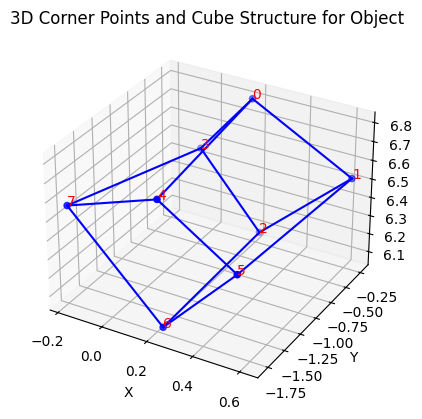

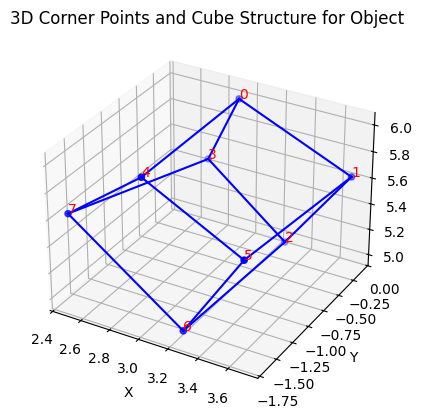

In [12]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Function to plot 3D corner points from predictions and connect them to form a cube
def plot_3d_corners(predictions_3d):
    # Check if predictions are available
    if predictions_3d is None:
        print("No predictions to plot.")
        return
    
    # Extract the last 24 elements for the 8 corner points (each corner has 3 coordinates)
    corner_predictions = predictions_3d[:, -24:].view(-1, 8, 3)

    # Plot each object’s corners in a 3D space
    for i, corners in enumerate(corner_predictions):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        
        # Coordinates of the corners
        x, y, z = corners[:, 0], corners[:, 1], corners[:, 2]
        ax.scatter(x, y, z, c='b', marker='o')

        # Annotate each corner for clarity
        for j, (x_coord, y_coord, z_coord) in enumerate(corners):
            ax.text(x_coord, y_coord, z_coord, f"{j}", color="red")

        # Define connections for the cube
        connections = [
            (0, 1), (1, 2), (2, 3), (3, 0),  # Bottom square
            (4, 5), (5, 6), (6, 7), (7, 4),  # Top square
            (0, 4), (1, 5), (2, 6), (3, 7)   # Vertical edges connecting squares
        ]

        # Plot lines for each connection
        for start, end in connections:
            ax.plot(
                [x[start], x[end]],
                [y[start], y[end]],
                [z[start], z[end]],
                'b-'
            )

        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        plt.title(f"3D Corner Points and Cube Structure for Object")
        plt.show()

# Plot the 3D corners from the predictions
plot_3d_corners(predictions_3d)


# To Validate Results with Actual Data

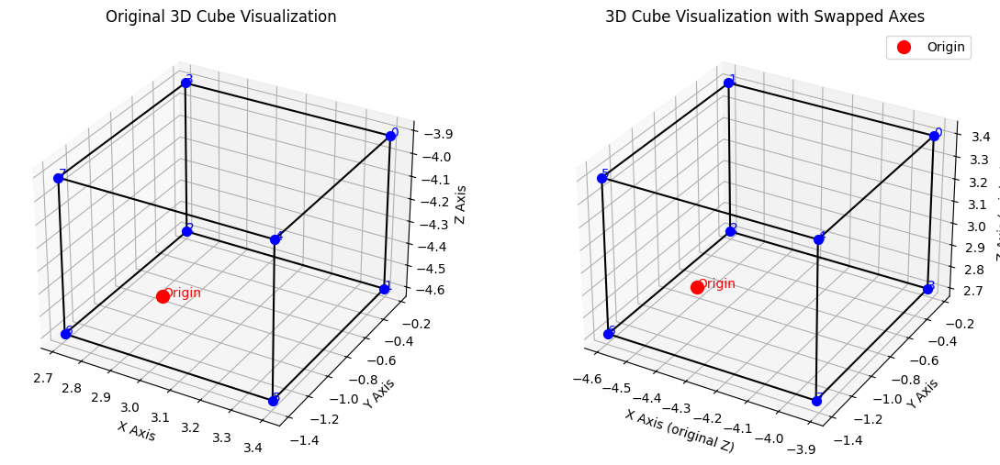

In [13]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define the points as a list of tuples (x, y, z)
points = [
    (3.049782, -1.4, -4.28893),  # Origin
    (3.404064, -0.2259196, -3.91012),
    (3.404064, -0.2259196, -4.593021),
    (2.711343, -0.2259196, -4.593021),
    (2.711343, -0.2259196, -3.91012),
    (3.404064, -1.4, -3.91012),
    (3.404064, -1.4, -4.593021),
    (2.711343, -1.4, -4.593021),
    (2.711343, -1.4, -3.91012)
]

# Define the edges of the cube by connecting the vertices
edges = [
    (1, 2), (2, 3), (3, 4), (4, 1),  # Top square
    (5, 6), (6, 7), (7, 8), (8, 5),  # Bottom square
    (1, 5), (2, 6), (3, 7), (4, 8)   # Vertical connections
]

# Create a figure with two subplots side by side
fig = plt.figure(figsize=(14, 6))

# Original 3D cube visualization
ax1 = fig.add_subplot(121, projection='3d')
for i, (x, y, z) in enumerate(points):
    if i == 0:
        ax1.scatter(x, y, z, color='red', s=100, label="Origin")  # Larger, red point for origin
        ax1.text(x, y, z, "Origin", color='red')
    else:
        ax1.scatter(x, y, z, color='blue', s=50)  # Blue points for other points
        ax1.text(x, y, z, f"{i-1}", color='blue')  # Label from 0 to 7

# Draw the edges for the original cube
for start, end in edges:
    x_line = [points[start][0], points[end][0]]
    y_line = [points[start][1], points[end][1]]
    z_line = [points[start][2], points[end][2]]
    ax1.plot(x_line, y_line, z_line, color="black")

# Setting labels and title for the original plot
ax1.set_xlabel("X Axis")
ax1.set_ylabel("Y Axis")
ax1.set_zlabel("Z Axis")
ax1.set_title("Original 3D Cube Visualization")

# Swapped axes visualization
ax2 = fig.add_subplot(122, projection='3d')
points_swapped = [(z, y, x) for x, y, z in points]  # Swap x and z values
for i, (x, y, z) in enumerate(points_swapped):
    if i == 0:
        ax2.scatter(x, y, z, color='red', s=100, label="Origin")  # Larger, red point for origin
        ax2.text(x, y, z, "Origin", color='red')
    else:
        ax2.scatter(x, y, z, color='blue', s=50)  # Blue points for other points
        ax2.text(x, y, z, f"{i-1}", color='blue')  # Label from 0 to 7

# Draw the edges for the swapped cube
for start, end in edges:
    x_line = [points_swapped[start][0], points_swapped[end][0]]
    y_line = [points_swapped[start][1], points_swapped[end][1]]
    z_line = [points_swapped[start][2], points_swapped[end][2]]
    ax2.plot(x_line, y_line, z_line, color="black")

# Setting labels and title for the swapped axes plot
ax2.set_xlabel("X Axis (original Z)")
ax2.set_ylabel("Y Axis")
ax2.set_zlabel("Z Axis (original X)")
ax2.set_title("3D Cube Visualization with Swapped Axes")

# Show the combined plot with a legend
plt.legend()
plt.show()


In [ ]:
import os
import pandas as pd
import numpy as np

# Path to the directories
base_path_2d = r"C:\Users\sakar\OneDrive\mt-datas\synthetic_data\8_correct_relative\2d_data"
base_path_3d = r"C:\Users\sakar\OneDrive\mt-datas\synthetic_data\8_correct_relative\3d_data"

# Functions to calculate errors
def calculate_mse(predicted, actual):
    return np.mean((predicted - actual) ** 2)

def calculate_rmse(predicted, actual):
    return np.sqrt(calculate_mse(predicted, actual))

def calculate_mae(predicted, actual):
    return np.mean(np.abs(predicted - actual))

# Loop through the 2D files
errors = {}
for file_name in os.listdir(base_path_2d):
    if file_name.endswith(".csv"):
        file_2d_path = os.path.join(base_path_2d, file_name)
        file_3d_path = os.path.join(base_path_3d, file_name)

        # Check if the corresponding 3D file exists
        if not os.path.exists(file_3d_path):
            print(f"3D data file for {file_name} not found. Skipping.")
            continue

        # Predict 3D points using the provided function
        predicted_3d = load_model_and_predict_3d(file_2d_path)
        if predicted_3d is None:
            print(f"Prediction failed for {file_name}. Skipping.")
            continue

        # Read the actual 3D points
        try:
            actual_3d_df = pd.read_csv(file_3d_path, header=None)
            actual_3d = actual_3d_df.iloc[:, 1:].values  # Drop the ID column
        except Exception as e:
            print(f"Error loading or processing 3D data for {file_name}: {e}")
            continue

        # Initialize error tracking for this file
        position_rmse, rotation_rmse, corner_rmse = [], [], []
        position_mae, rotation_mae, corner_mae = [], [], []
        total_object_rmse, total_object_mae = [], []

        # Loop through each row (object) in the file
        for i in range(predicted_3d.shape[0]):
            pred = predicted_3d[i]
            actual = actual_3d[i]

            # Ensure conversion to NumPy for each row
            if isinstance(pred, torch.Tensor):
                pred = pred.numpy()
            if isinstance(actual, torch.Tensor):
                actual = actual.numpy()

            # Extract components
            pred_position = pred[:3]
            actual_position = actual[:3]

            pred_rotation = pred[3:6]
            actual_rotation = actual[3:6]

            pred_corners = pred[6:].reshape(8, 3)
            actual_corners = actual[6:].reshape(8, 3)

            # Calculate RMSE and MAE for position, rotation, and corners
            pos_rmse = calculate_rmse(pred_position, actual_position)
            rot_rmse = calculate_rmse(pred_rotation, actual_rotation)
            corner_rmse_values = [calculate_rmse(pred_corners[j], actual_corners[j]) for j in range(8)]
            
            pos_mae = calculate_mae(pred_position, actual_position)
            rot_mae = calculate_mae(pred_rotation, actual_rotation)
            corner_mae_values = [calculate_mae(pred_corners[j], actual_corners[j]) for j in range(8)]

            # Total RMSE and MAE for this object
            object_rmse = pos_rmse + rot_rmse + sum(corner_rmse_values)
            object_mae = pos_mae + rot_mae + sum(corner_mae_values)

            # Append errors
            position_rmse.append(pos_rmse)
            rotation_rmse.append(rot_rmse)
            corner_rmse.append(sum(corner_rmse_values) / 8)  # Avg corner RMSE
            
            position_mae.append(pos_mae)
            rotation_mae.append(rot_mae)
            corner_mae.append(sum(corner_mae_values) / 8)  # Avg corner MAE
            
            total_object_rmse.append(object_rmse)
            total_object_mae.append(object_mae)

        # Aggregate RMSE and MAE for the file
        file_rmse = {
            "position": np.mean(position_rmse),
            "rotation": np.mean(rotation_rmse),
            "corners": np.mean(corner_rmse),
            "total": np.mean(total_object_rmse),
        }
        file_mae = {
            "position": np.mean(position_mae),
            "rotation": np.mean(rotation_mae),
            "corners": np.mean(corner_mae),
            "total": np.mean(total_object_mae),
        }

        # Save results
        errors[file_name] = {
            "RMSE": file_rmse,
            "MAE": file_mae,
        }

        print(f"Errors for {file_name}:\nRMSE: {file_rmse}\nMAE: {file_mae}")

# Display all errors
errors


tensor([[-1.9390e+00, -1.4979e+00,  5.8238e+00,  1.7834e-02,  1.3096e+02,
         -1.2584e-03, -1.9260e+00, -5.4899e-01,  5.7389e+00, -1.8897e+00,
         -5.4849e-01,  5.7740e+00, -2.0080e+00, -5.5617e-01,  5.6368e+00,
         -1.9215e+00, -5.4086e-01,  5.9433e+00, -1.9082e+00, -1.4914e+00,
          5.8031e+00, -1.9022e+00, -1.4985e+00,  5.7663e+00, -2.0456e+00,
         -1.5092e+00,  5.8762e+00, -2.0031e+00, -1.4797e+00,  5.9734e+00],
        [ 3.0360e+00, -1.7140e+00,  8.2380e+00,  7.7687e-03,  2.2741e+02,
          9.7119e-03,  3.1047e+00, -5.3643e-01,  8.4328e+00,  3.4083e+00,
         -5.4148e-01,  8.1670e+00,  3.0790e+00, -5.4684e-01,  7.7274e+00,
          2.9032e+00, -5.2092e-01,  8.3019e+00,  3.1085e+00, -1.6945e+00,
          8.3946e+00,  3.3236e+00, -1.7216e+00,  8.2134e+00,  3.0735e+00,
         -1.7472e+00,  7.9668e+00,  2.7593e+00, -1.7184e+00,  8.4942e+00],
        [-1.5044e+00, -1.5076e+00,  1.2570e+01, -2.3047e-02,  2.5885e+02,
          5.6777e-03, -1.3040e+00,  

{'0.csv': {'position_error': 5.452121586185314,
  'rotation_error': 3553.195847546227,
  'corner_error': 5.459448713277164,
  'total_error': 3602.323558838629},
 '1.csv': {'position_error': 6.8079096327117545,
  'rotation_error': 3105.1173149828824,
  'corner_error': 6.92756254960649,
  'total_error': 3167.3457250124457},
 '10.csv': {'position_error': 6.709233734670531,
  'rotation_error': 469.6390158344506,
  'corner_error': 6.553008857417439,
  'total_error': 528.7723204284606},
 '100.csv': {'position_error': 2.4117217589299638,
  'rotation_error': 1668.0417684225329,
  'corner_error': 2.2478037348659714,
  'total_error': 1688.4359200603906},
 '1000.csv': {'position_error': 2.4114257646935706,
  'rotation_error': 1351.1985701584128,
  'corner_error': 2.266891360057565,
  'total_error': 1371.7451268035668},
 '1001.csv': {'position_error': 4.194576180599297,
  'rotation_error': 8007.469147737301,
  'corner_error': 4.2981321559138665,
  'total_error': 8046.048781165212},
 '1002.csv': {'